# **Load Dataset and Preprocessing**

In [ ]:
!wget https://post.healthline.com/wp-content/uploads/2020/08/3180-Pug_green_grass-732x549-thumbnail.jpg -O pug_dog.jpeg

--2023-05-13 09:56:22--  https://post.healthline.com/wp-content/uploads/2020/08/3180-Pug_green_grass-732x549-thumbnail.jpg
Resolving post.healthline.com (post.healthline.com)... 151.101.2.133, 151.101.66.133, 151.101.130.133, ...
Connecting to post.healthline.com (post.healthline.com)|151.101.2.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 35816 (35K) [image/jpeg]
Saving to: ‘pug_dog.jpeg’

pug_dog.jpeg        100%[===================>]  34.98K  --.-KB/s    in 0.002s  

2023-05-13 09:56:22 (20.4 MB/s) - ‘pug_dog.jpeg’ saved [35816/35816]



In [ ]:
!wget https://raw.githubusercontent.com/jacobgil/vit-explain/main/examples/plane.png -O plane.jpeg

In [ ]:
!wget https://github.com/EliSchwartz/imagenet-sample-images/blob/master/n01669191_box_turtle.JPEG?raw=true -O box_turtle.jpeg

--2023-05-13 09:56:20--  https://github.com/EliSchwartz/imagenet-sample-images/blob/master/n01669191_box_turtle.JPEG?raw=true
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/EliSchwartz/imagenet-sample-images/raw/master/n01669191_box_turtle.JPEG [following]
--2023-05-13 09:56:20--  https://github.com/EliSchwartz/imagenet-sample-images/raw/master/n01669191_box_turtle.JPEG
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/EliSchwartz/imagenet-sample-images/master/n01669191_box_turtle.JPEG [following]
--2023-05-13 09:56:20--  https://raw.githubusercontent.com/EliSchwartz/imagenet-sample-images/master/n01669191_box_turtle.JPEG
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Conne

In [ ]:
!wget https://github.com/EliSchwartz/imagenet-sample-images/blob/master/n01518878_ostrich.JPEG?raw=true -O ostrich.jpeg

In [ ]:
!wget https://github.com/EliSchwartz/imagenet-sample-images/blob/master/n01582220_magpie.JPEG?raw=true -O magpie.jpeg

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

def transform_image(image_path):
    # Define the transforms
    tfms = transforms.Compose([
        transforms.Resize(256, interpolation=3),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ])

    # Load and transform the image
    img = Image.open(image_path)
    image_tensor = tfms(img)
    image_tensor = torch.unsqueeze(image_tensor, 0)  # Add a batch dimension
    print(image_tensor.size())
    return image_tensor


def view_image(image_path):
    im = Image.open(image_path)
    plt.imshow(im)
    plt.show()

In [ ]:
pug_dog_tensor = transform_image('/content/pug_dog.jpeg')
plane_tensor = transform_image('/content/plane.jpeg')
ostrich_tensor = transform_image('/content/ostrich.jpeg')
magpie_tensor = transform_image('/content/magpie.jpeg')
box_turtle_tensor = transform_image('/content/box_turtle.jpeg')

torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])
torch.Size([1, 3, 224, 224])


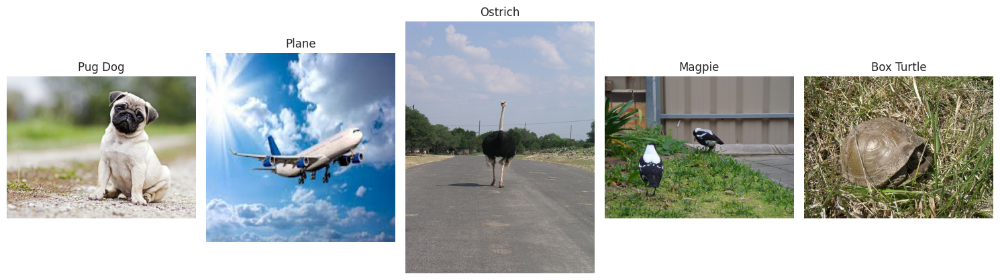

In [ ]:
image_paths = [
    ("/content/pug_dog.jpeg", "Pug Dog"),
    ("/content/plane.jpeg", "Plane"),
    ("/content/ostrich.jpeg", "Ostrich"),
    ("/content/magpie.jpeg", "Magpie"),
    ("/content/box_turtle.jpeg", "Box Turtle")
]

# Create a 2x3 subplot grid
fig, axs = plt.subplots(1, len(image_paths), figsize=(15, 5))

# Iterate over image paths and plot in each subplot
for i, (image_path, title) in enumerate(image_paths):
    axs[i].imshow(Image.open(image_path))
    axs[i].set_title(title)
    axs[i].axis('off')  # Remove axis and grid lines

plt.tight_layout()  # Adjust spacing between subplots
plt.show()

# **Load Pretrained ViT model**

Using different variant of ViT models:

1. **Vanilla ViT models**:

  a. vit_base_patch16_224
      - *patch_size*, 16
      - *num_layers*, 12
      - *num_heads*, 12

  b. vit_base_patch32_224
      - *patch_size*, 32
      - *num_layers*, 24
      - *num_heads*, 12

  c. vit_large_patch16_224
      - *patch_size*, 16
      - *num_layers*, 24
      - *num_heads*, 16

2. **ViT DeiT models**

  a. deit_tiny_patch16_224
      - *patch_size*, 16
      - *num_layers*, 12
      - *num_heads*, 3




In [ ]:
!pip install timm==0.6.13

In [ ]:
import timm

# Load pre-trained Vision Transformer models

model_vit_b_16 = timm.create_model('vit_base_patch16_224', pretrained=True)
print("vit_b_16 loaded successfully")

model_vit_b_32 = timm.create_model('vit_base_patch32_224', pretrained=True)
print("vit_b_32 loaded successfully")

model_vit_l_16 = timm.create_model('vit_large_patch16_224', pretrained=True)
print("vit_1_16 loaded successfully")

model_deit_b_16 = torch.hub.load('facebookresearch/deit:main', 'deit_tiny_patch16_224', pretrained=True)
print("model_deit_b_16 loaded successfully")

vit_b_16 loaded successfully
vit_b_32 loaded successfully
vit_1_16 loaded successfully


Using cache found in /root/.cache/torch/hub/facebookresearch_deit_main


model_deit_b_16 loaded successfully


# **Calculating Attention Maps**


## **Hook Utility Handler and Computing a score matrix**

In [ ]:
from torch import nn

class Hook:
    def __init__(self,model: nn.Module, module='attn.attn_drop',mode="output") -> None:
        """set a hook to get the intermedia results

        Args:
            model (nn.Module): ViTs
            module (str, optional): Name of module. 'attn.attn_drop' for attn matrix; 'block' for outputs of blocks. Defaults to 'attn.attn_drop'.
        """
        assert mode in ["input", "output"]
        self.mode = mode 
        self.model = model
        self.module = module
    
    
    def register_hook(self):
        for name, m in self.model.named_modules():
            if name.endswith(self.module):
                yield m.register_forward_hook(self._hook)
    
    def _hook(self,m,input,output):
        if self.mode == "output":
            self.outputs.append(output)
        else:
            self.outputs.append(input)
        
    def __call__(self, *args,**kwargs):
        self.outputs=[]
        hook_handlers = list(self.register_hook())
        out=self.model(*args,**kwargs)
        for h in hook_handlers: h.remove()
        
        return out,self.outputs    

## **Instantiate the hook and extract the corresponding attention matrices for the input images**

In [ ]:
# vit_base_patch16_224
hook = Hook(model_vit_b_16)
outputs_vit_b_16_pug_dog, attn_matrices_vit_b_16_pug_dog = hook(pug_dog_tensor)

# vit_base_patch32_224
hook = Hook(model_vit_b_32)
outputs_vit_b_32_pug_dog, attn_matrices_vit_b_32_pug_dog = hook(pug_dog_tensor)

# vit_large_patch16_224
hook = Hook(model_vit_l_16)
outputs_vit_1_16_pug_dog, attn_matrices_vit_1_16_pug_dog = hook(pug_dog_tensor)

# deit_tiny_patch16_224
hook = Hook(model_deit_b_16)
outputs_deit_b_16_pug_dog, attn_matrices_deit_b_16_pug_dog = hook(pug_dog_tensor)

## **Get the Actual prediction value from the output**

From imagenet classes label, 254 is *pug, pug-dog*

In [ ]:
def get_class(output):
    max_value_index = torch.argmax(output)
    return [ max_value_index, max(output[0])]

data1 = get_class(outputs_vit_b_16_pug_dog)
print(data1)
data2 = get_class(outputs_vit_b_32_pug_dog)
print(data2)
data3 = get_class(outputs_vit_1_16_pug_dog,)
print(data3)
data4 = get_class(outputs_deit_b_16_pug_dog,)
print(data4)

[tensor(254), tensor(13.2333, grad_fn=<UnbindBackward0>)]
[tensor(254), tensor(13.4183, grad_fn=<UnbindBackward0>)]
[tensor(254), tensor(13.7746, grad_fn=<UnbindBackward0>)]
[tensor(254), tensor(8.8246, grad_fn=<UnbindBackward0>)]


In [ ]:
def print_model_info(attn_matrices, model_name):
    print('{}:'.format(model_name))
    print('Number of Layers: {}'.format(len(attn_matrices)))
    print(attn_matrices[0].shape)
    print('Number of Heads: {}'.format(attn_matrices[0].shape[1]))
    print("-----------------------------------------------------")


print_model_info(attn_matrices_vit_b_16_pug_dog, "vit_base_patch16_224")
print_model_info(attn_matrices_vit_b_32_pug_dog, "vit_base_patch32_224")
print_model_info(attn_matrices_vit_1_16_pug_dog, "vit_large_patch16_224")
print_model_info(attn_matrices_deit_b_16_pug_dog, "deit_tiny_patch16_224")

vit_base_patch16_224:
Number of Layers: 12
torch.Size([1, 12, 197, 197])
Number of Heads: 12
-----------------------------------------------------
vit_base_patch32_224:
Number of Layers: 12
torch.Size([1, 12, 50, 50])
Number of Heads: 12
-----------------------------------------------------
vit_large_patch16_224:
Number of Layers: 24
torch.Size([1, 16, 197, 197])
Number of Heads: 16
-----------------------------------------------------
deit_tiny_patch16_224:
Number of Layers: 12
torch.Size([1, 3, 197, 197])
Number of Heads: 3
-----------------------------------------------------


## **Compute a score matrix of dimensions 14x14 for 16x16 patch_size and 7x7 for 32x32 patch_size**

In [ ]:
def compute_score_matrix(attn_matrices, patch_size=16):

    # Remove the cls token
    attn_no_cls = [attn[:, :, 1:, 1:] for attn in attn_matrices] 

    # Calculate the maximum value across the sequence dimension for each head
    max_values = [attn.max(dim=-1, keepdim=True)[0] for attn in attn_no_cls]

    # Compute the mean of the maximum values across all the heads
    mean_max_values = [attn.mean(dim=1, keepdim=True) for attn in max_values]

    # Reshape the tensor to 14x14 and stack into a single tensor
    if (patch_size == 16):
        score_matrix = torch.cat([attn.view(1, 1, 14, 14) for attn in mean_max_values], dim=1)
    else:
        score_matrix = torch.cat([attn.view(1, 1, 7, 7) for attn in mean_max_values], dim=1)

    print(score_matrix.shape)  
    
    return score_matrix

In [ ]:
vit_b_16_pug_dog_scr_matrix = compute_score_matrix(attn_matrices_vit_b_16_pug_dog)
vit_b_32_pug_dog_scr_matrix = compute_score_matrix(attn_matrices_vit_b_32_pug_dog, 32)
vit_1_16_pug_dog_scr_matrix = compute_score_matrix(attn_matrices_vit_1_16_pug_dog)
deit_b_16_pug_dog_scr_matrix = compute_score_matrix(attn_matrices_deit_b_16_pug_dog)

torch.Size([1, 12, 14, 14])
torch.Size([1, 12, 7, 7])
torch.Size([1, 24, 14, 14])
torch.Size([1, 12, 14, 14])


# **Visualize the Self Attention Maps as changes across different layers**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def visualize_attention_maps(score_matrix, model_name, num_layers=12):
    # Set a dark grid style for the plots
    sns.set_style("darkgrid")

    # Set a custom color map
    cmap = sns.diverging_palette(220, 20, as_cmap=True)

    # Create a grid of subplots for each layer
    if (num_layers == 12):
        fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(15, 12))
    else:
        fig, axes = plt.subplots(nrows=8, ncols=3, figsize=(20, 16))

    # Add a title for the entire figure
    fig.suptitle(f'Attention Maps for each {model_name} Transformer Layer', fontsize=20, y=1.02)

    # Visualize the score matrix for each layer
    for i, ax in enumerate(axes.flat):
      # Get the score matrix for the current layer
      layer_score_matrix = score_matrix[0, i].detach().numpy()

      # Plot the score matrix as a heatmap
      sns.heatmap(layer_score_matrix, ax=ax, cmap=cmap)

      # Set the title for the current subplot
      ax.set_title(f"Layer {i + 1}", fontsize=15)

      # Remove the x and y ticks
      ax.set_xticks([])
      ax.set_yticks([])

    # Adjust the layout and display the plot
    plt.tight_layout()
    plt.show()



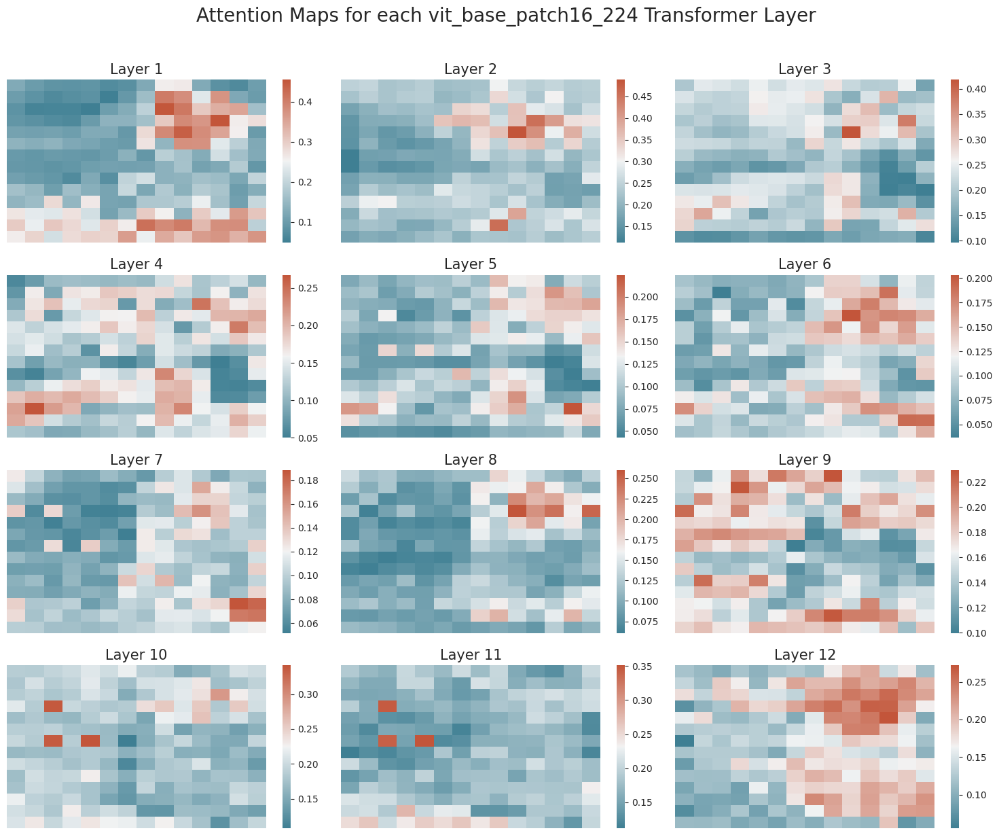

In [ ]:
visualize_attention_maps(vit_b_16_pug_dog_scr_matrix, "vit_base_patch16_224")

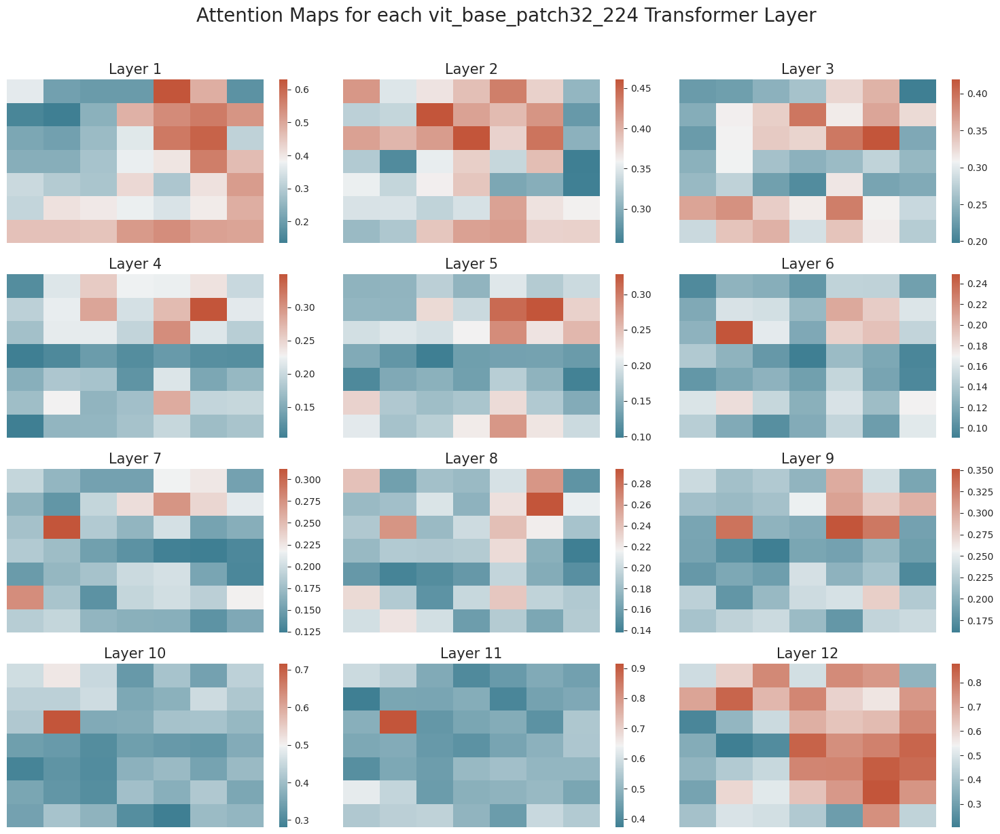

In [ ]:
visualize_attention_maps(vit_b_32_pug_dog_scr_matrix, "vit_base_patch32_224")

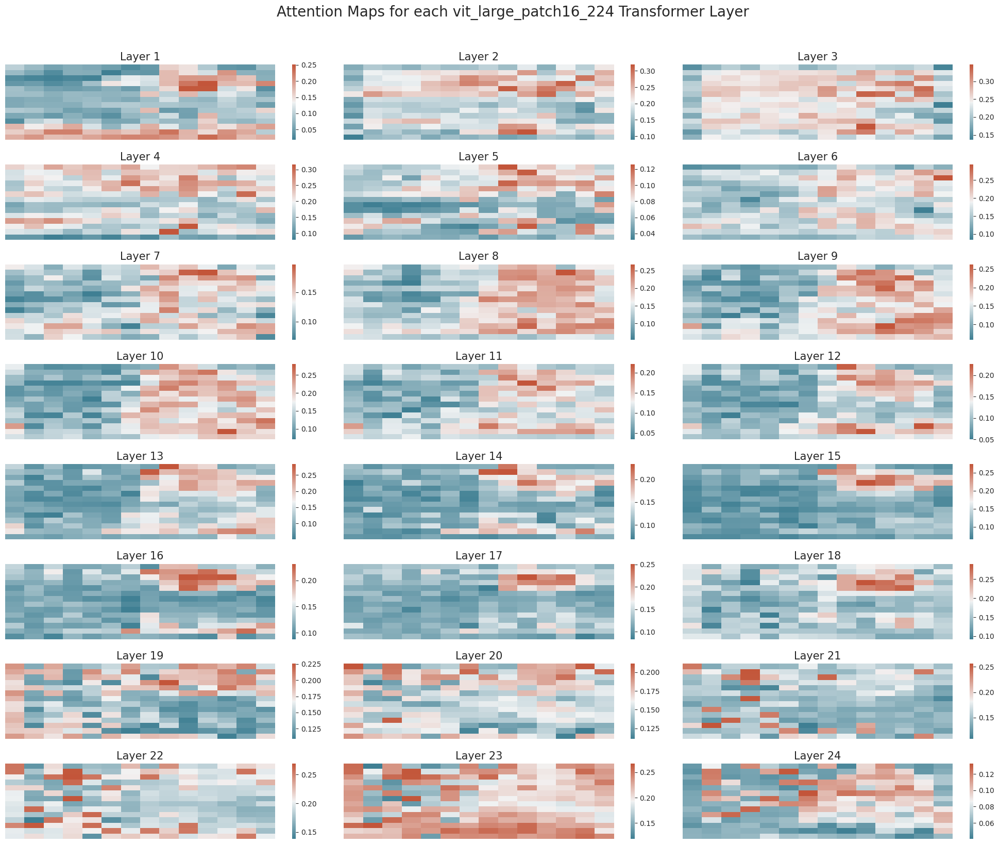

In [ ]:
visualize_attention_maps(vit_1_16_pug_dog_scr_matrix, "vit_large_patch16_224", 24)

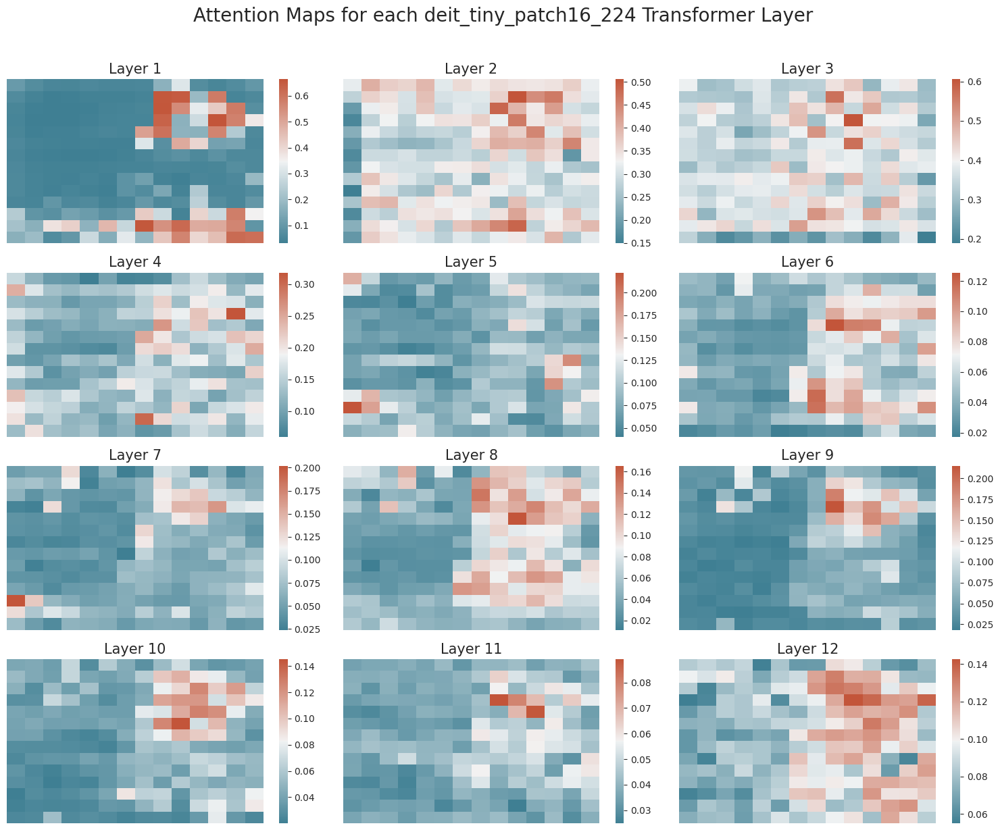

In [ ]:
visualize_attention_maps(deit_b_16_pug_dog_scr_matrix, "deit_tiny_patch16_224")

# **Implement Attention Rollout**

In [ ]:
import torch
from PIL import Image
import numpy
import sys
from torchvision import transforms
import numpy as np
import cv2

def rollout(attentions, discard_ratio, head_fusion):
    result = torch.eye(attentions[0].size(-1))
    with torch.no_grad():
        for attention in attentions:
            if head_fusion == "mean":
                attention_heads_fused = attention.mean(axis=1)
            elif head_fusion == "max":
                attention_heads_fused = attention.max(axis=1)[0]
            elif head_fusion == "min":
                attention_heads_fused = attention.min(axis=1)[0]
            else:
                raise "Attention head fusion type Not supported"

            # Drop the lowest attentions, but
            # don't drop the class token
            flat = attention_heads_fused.view(attention_heads_fused.size(0), -1)
            _, indices = flat.topk(int(flat.size(-1)*discard_ratio), -1, False)
            indices = indices[indices != 0]
            flat[0, indices] = 0

            I = torch.eye(attention_heads_fused.size(-1))
            a = (attention_heads_fused + 1.0*I)/2
            a = a / a.sum(dim=-1)

            result = torch.matmul(a, result)
    
    # Look at the total attention between the class token,
    # and the image patches
    mask = result[0, 0 , 1 :]
    # In case of 224x224 image, this brings us from 196 to 14
    width = int(mask.size(-1)**0.5)
    mask = mask.reshape(width, width).numpy()
    mask = mask / np.max(mask)
    return mask    

class VITAttentionRollout:
    def __init__(self, model, attention_layer_name='attn_drop', head_fusion="mean",
        discard_ratio=0.9):
        self.model = model
        self.head_fusion = head_fusion
        self.discard_ratio = discard_ratio
        for name, module in self.model.named_modules():
            if attention_layer_name in name:
                module.register_forward_hook(self.get_attention)

        self.attentions = []

    def get_attention(self, module, input, output):
        self.attentions.append(output.cpu())

    def __call__(self, input_tensor):
        self.attentions = []
        with torch.no_grad():
            output = self.model(input_tensor)

        return rollout(self.attentions, self.discard_ratio, self.head_fusion)

In [ ]:
import matplotlib.pyplot as plt

def show_mask_on_image(img, mask):
    img = np.float32(img) / 255
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    return np.uint8(255 * cam)

def implement_attention_rollout(
    model, input_tensor, image_path, category_index=None, isGradient=False):
    if not isGradient:
        attention_rollout = VITAttentionRollout(model)
        mask = attention_rollout(input_tensor)
    else:
        grad_attention_rollout = VITAttentionGradRollout(model)
        mask = grad_attention_rollout(input_tensor, category_index)

    img = Image.open(image_path)
    img = img.resize((224, 224))
    np_img = np.array(img)[:, :, ::-1]
    mask = cv2.resize(mask, (np_img.shape[1], np_img.shape[0]))
    mask = show_mask_on_image(np_img, mask)
    return np_img, mask

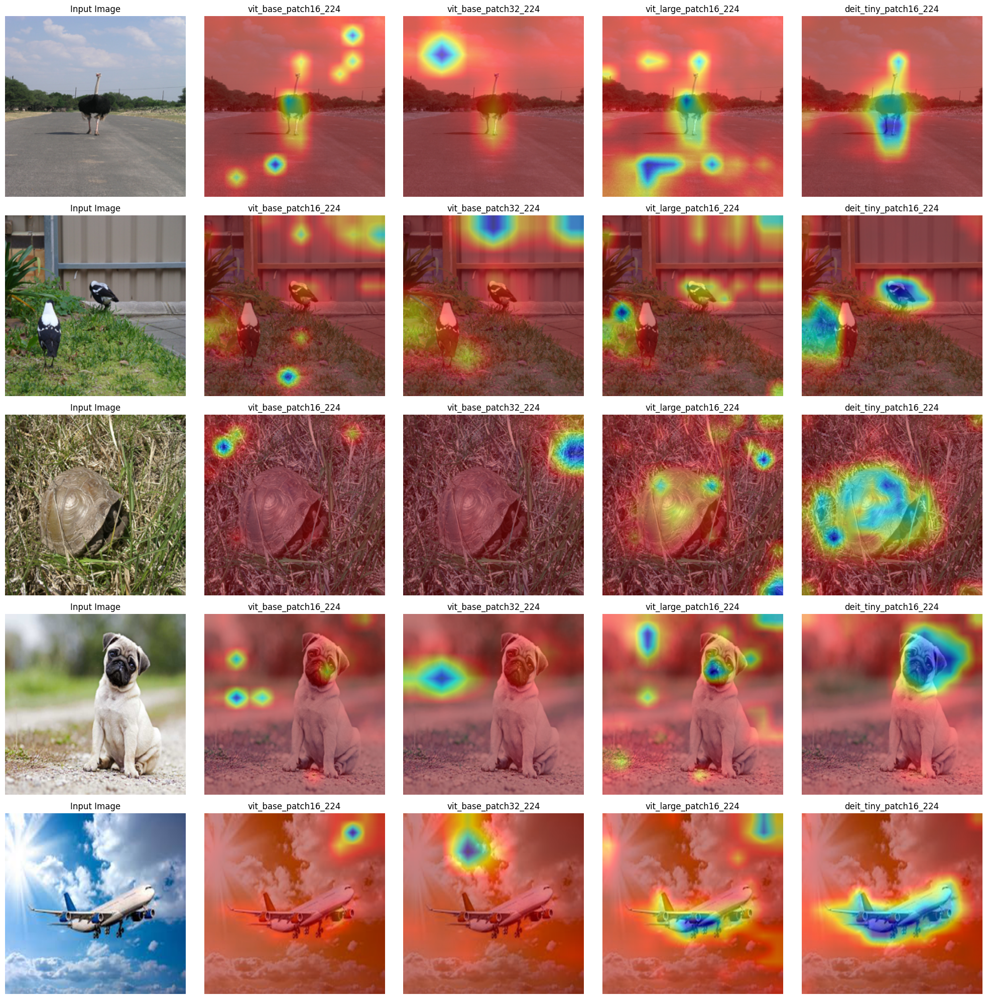

In [ ]:
model_vocab = [
    ("vit_base_patch16_224", model_vit_b_16),
    ("vit_base_patch32_224", model_vit_b_32),
    ("vit_large_patch16_224", model_vit_l_16),
    ("deit_tiny_patch16_224", model_deit_b_16),
]

image_data = [
    ("/content/ostrich.jpeg", ostrich_tensor, 9),
    ("/content/magpie.jpeg", magpie_tensor, 18),
    ("/content/box_turtle.jpeg", box_turtle_tensor,37),
    ("/content/pug_dog.jpeg", pug_dog_tensor, 254),
    ("/content/plane.jpeg", plane_tensor, 404),
]

# Total number of rows is the number of images
fig, axs = plt.subplots(len(image_data), len(model_vocab) + 1, figsize=(20, 20))

for i, (image_path, image_tensor, _) in enumerate(image_data):
    # Display the original image
    img = Image.open(image_path)
    img = img.resize((224, 224))
    axs[i, 0].imshow(img)
    axs[i, 0].set_title("Input Image")
    axs[i, 0].axis('off')

    # Display the attention rollout for each model
    for j, (name, model) in enumerate(model_vocab):
        np_img, mask = implement_attention_rollout(model, image_tensor, image_path)
        axs[i, j + 1].imshow(mask)
        axs[i, j + 1].set_title(name)
        axs[i, j + 1].axis('off')

plt.tight_layout()
plt.savefig("rollout_results.png")  # Save the figure
plt.show()


## **Gradient Attention Rollout Technique**

To enhance the attention rollout method, we introduce a refined variant that leverages gradients in the attention computation. These gradients illustrate the extent to which each segment of the input influences the ultimate prediction. By integrating the attention with these gradients, we not only highlight the regions on which the model concentrates but also emphasize those that significantly impact the final decision.

This refined approach conducts backpropagation on the output class of interest to obtain the gradients of the attention weights. These gradients are then employed as weights to merge the attentions across various heads. Any negative weights are disregarded, and the remaining positive weights are normalized to sum to one. 

This innovative methodology ensures that our attention is focused not just on areas the model deems significant, but also on the regions that actually contribute more towards the final prediction. Consequently, this provides a more nuanced understanding of the model's attention mechanism and enhances the interpretability of our model's decision-making process.

In [ ]:
import torch
from PIL import Image
import numpy
import sys
from torchvision import transforms
import numpy as np
import cv2

def grad_rollout(attentions, gradients, discard_ratio):
    result = torch.eye(attentions[0].size(-1))
    with torch.no_grad():
        for attention, grad in zip(attentions, gradients):                
            weights = grad
            attention_heads_fused = (attention*weights).mean(axis=1)
            attention_heads_fused[attention_heads_fused < 0] = 0

            # Drop the lowest attentions, but
            # don't drop the class token
            flat = attention_heads_fused.view(attention_heads_fused.size(0), -1)
            _, indices = flat.topk(int(flat.size(-1)*discard_ratio), -1, False)
            #indices = indices[indices != 0]
            flat[0, indices] = 0

            I = torch.eye(attention_heads_fused.size(-1))
            a = (attention_heads_fused + 1.0*I)/2
            a = a / a.sum(dim=-1)
            result = torch.matmul(a, result)
    
    # Look at the total attention between the class token,
    # and the image patches
    mask = result[0, 0 , 1 :]
    # In case of 224x224 image, this brings us from 196 to 14
    width = int(mask.size(-1)**0.5)
    mask = mask.reshape(width, width).numpy()
    mask = mask / np.max(mask)
    return mask    

class VITAttentionGradRollout:
    def __init__(self, model, attention_layer_name='attn_drop',
        discard_ratio=0.9):
        self.model = model
        self.discard_ratio = discard_ratio
        for name, module in self.model.named_modules():
            if attention_layer_name in name:
                module.register_forward_hook(self.get_attention)
                module.register_backward_hook(self.get_attention_gradient)

        self.attentions = []
        self.attention_gradients = []

    def get_attention(self, module, input, output):
        self.attentions.append(output.cpu())

    def get_attention_gradient(self, module, grad_input, grad_output):
        self.attention_gradients.append(grad_input[0].cpu())

    def __call__(self, input_tensor, category_index):
        self.model.zero_grad()
        output = self.model(input_tensor)
        category_mask = torch.zeros(output.size())
        category_mask[:, category_index] = 1
        loss = (output*category_mask).sum()
        loss.backward()

        return grad_rollout(self.attentions, self.attention_gradients,
            self.discard_ratio)

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


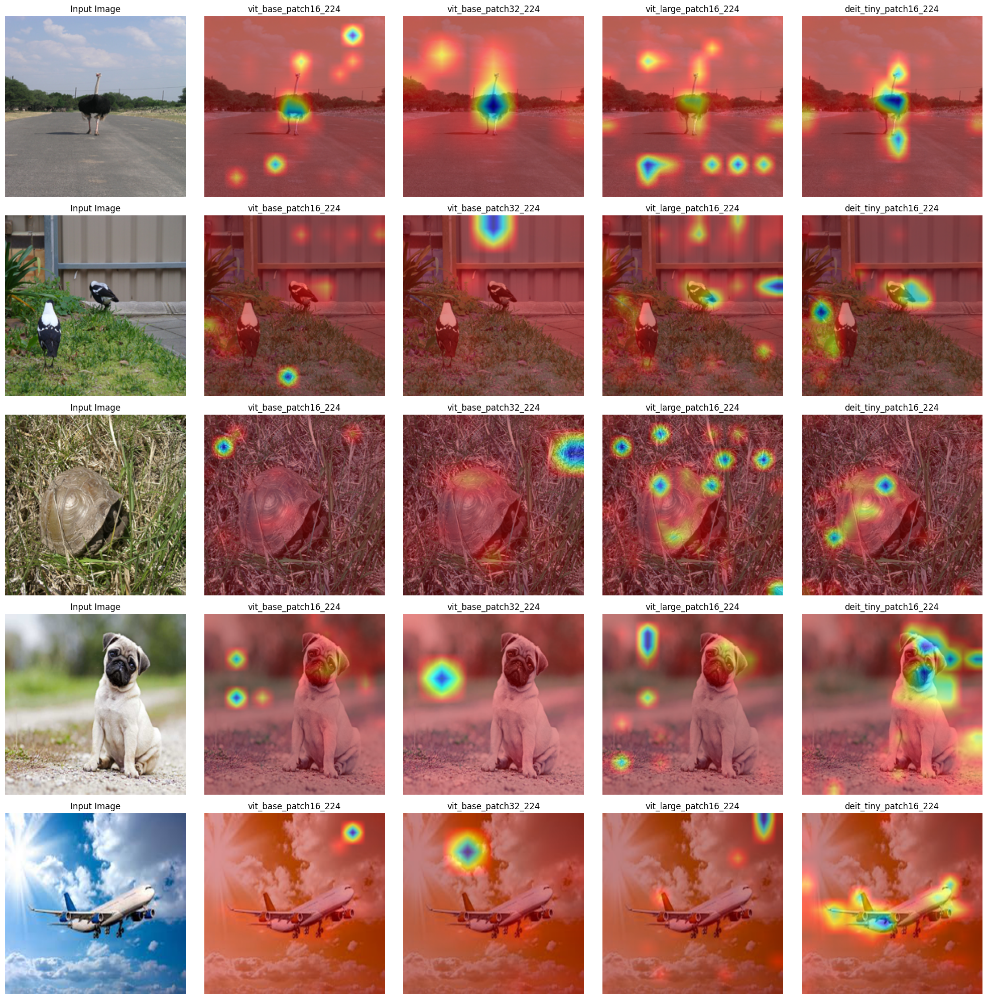

In [ ]:
# Total number of rows is the number of images
fig, axs = plt.subplots(len(image_data), len(model_vocab) + 1, figsize=(20, 20))

for i, (image_path, image_tensor, category_index) in enumerate(image_data):
    # Display the original image
    img = Image.open(image_path)
    img = img.resize((224, 224))
    axs[i, 0].imshow(img)
    axs[i, 0].set_title("Input Image")
    axs[i, 0].axis('off')

    # Display the attention rollout for each model
    for j, (name, model) in enumerate(model_vocab):
        np_img, mask = implement_attention_rollout(model, image_tensor, image_path, category_index=category_index, isGradient=True)
        axs[i, j + 1].imshow(mask)
        axs[i, j + 1].set_title(name)
        axs[i, j + 1].axis('off')

plt.tight_layout()
plt.savefig("grad_rollout_results.png")  # Save the figure
plt.show()
